In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import random
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.math import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
tf.random.set_seed(3)
import glob 
import skimage as oi
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, LeakyReLU

C:\ProgramData\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
folders_names = []
##'/kaggle/input/leapgestrecog/leapGestRecog/0'
for i in range(10):
    folder = "D:\\Downloads\\archive\\leapGestRecog\\0{}".format(i)
    folders_names.append(folder)

files_names = ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb']

In [3]:
folders_names

['D:\\Downloads\\archive\\leapGestRecog\\00',
 'D:\\Downloads\\archive\\leapGestRecog\\01',
 'D:\\Downloads\\archive\\leapGestRecog\\02',
 'D:\\Downloads\\archive\\leapGestRecog\\03',
 'D:\\Downloads\\archive\\leapGestRecog\\04',
 'D:\\Downloads\\archive\\leapGestRecog\\05',
 'D:\\Downloads\\archive\\leapGestRecog\\06',
 'D:\\Downloads\\archive\\leapGestRecog\\07',
 'D:\\Downloads\\archive\\leapGestRecog\\08',
 'D:\\Downloads\\archive\\leapGestRecog\\09']

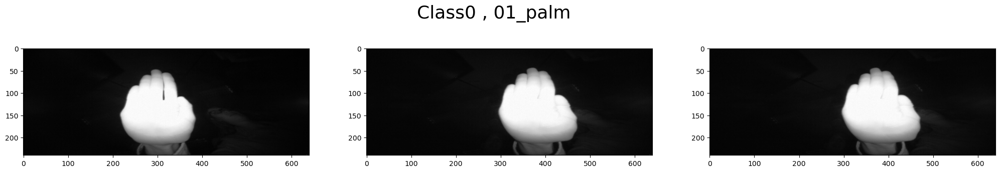

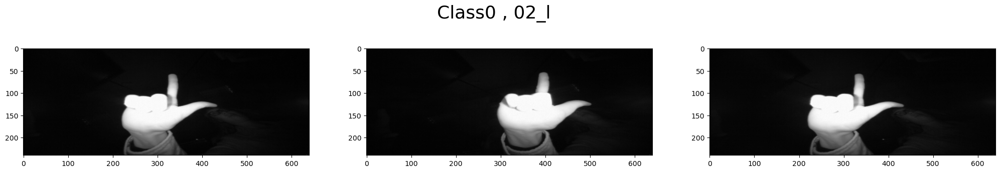

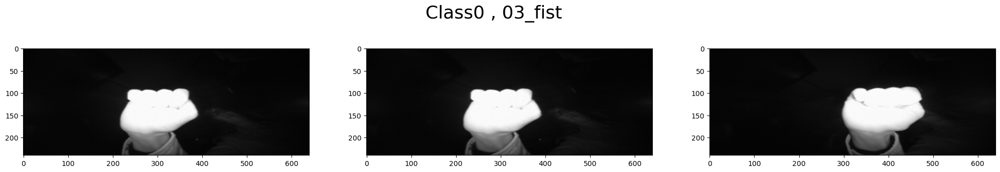

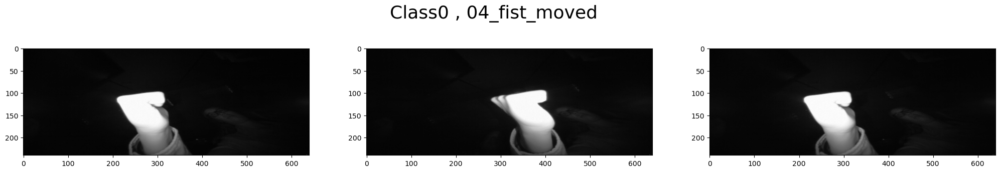

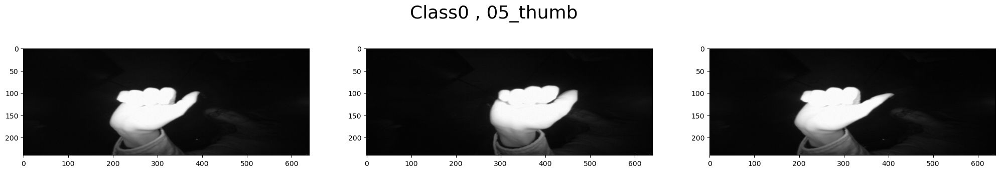

...

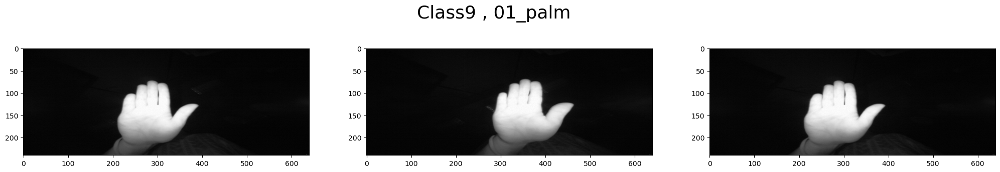

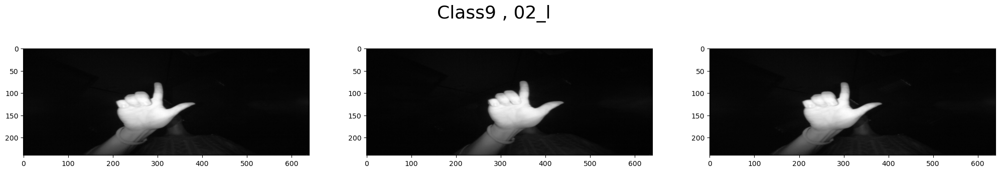

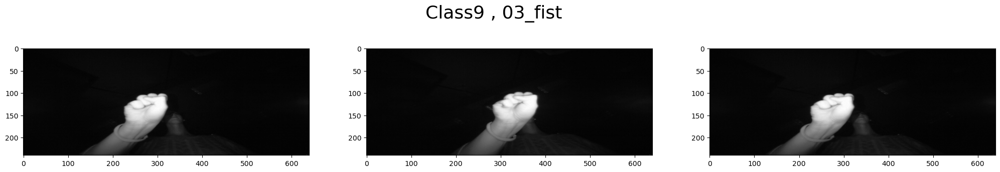

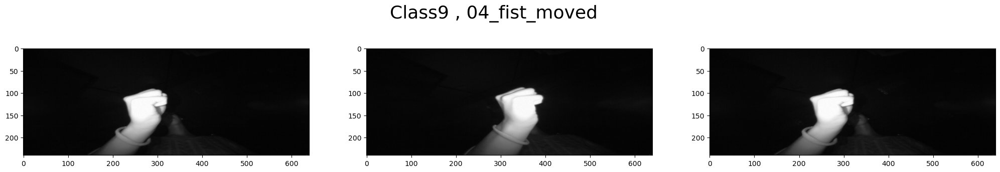

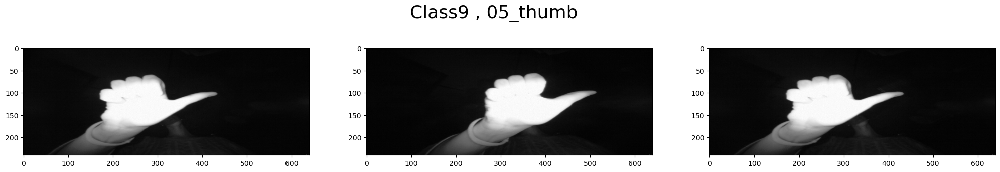

In [4]:
for folder in folders_names:
        Class_num=folder[-1]
        for file in files_names:
            path = os.path.join(folder, file)
            x=0
            fig, axes = plt.subplots(1,3, figsize=(25, 4))  
            for img in os.listdir(path):
                
                
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                axes[x].imshow(img_array, cmap='gray')
                x += 1
                if x == 3: 
                    break

            plt.suptitle(f"Class{Class_num} , {file}", fontsize=26)
            plt.show()

In [5]:
training_data = []

def create_training_data():
    for folder in folders_names:
        Class_num=folder[-1]
        print('Class ' ,Class_num)
        for file in files_names:
            path = os.path.join(folder, file)

            print('Class ' ,Class_num,file)
#             c=0
            
            for img in tqdm(os.listdir(path)):
#                 if(c==100):
#                     break
#                 c+=1
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                
          
                training_data.append([img_array,int(Class_num)])
                        
    
create_training_data()   

Class  0
Class  0 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 139.46it/s]


Class  0 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 168.15it/s]


Class  0 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 170.47it/s]


Class  0 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 184.15it/s]


Class  0 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 175.96it/s]


Class  1
Class  1 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 141.87it/s]


Class  1 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 163.29it/s]


Class  1 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 141.84it/s]


Class  1 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 351.05it/s]


Class  1 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 347.37it/s]


Class  2
Class  2 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 408.22it/s]


Class  2 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 382.30it/s]


Class  2 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 389.49it/s]


Class  2 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 568.96it/s]


Class  2 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 623.07it/s]


Class  3
Class  3 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 635.97it/s]


Class  3 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 632.29it/s]


Class  3 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 591.55it/s]


Class  3 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 742.17it/s]


Class  3 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 732.89it/s]


Class  4
Class  4 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 614.00it/s]


Class  4 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 607.77it/s]


Class  4 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 624.18it/s]


Class  4 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 556.30it/s]


Class  4 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 579.84it/s]


Class  5
Class  5 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 691.39it/s]


Class  5 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 531.00it/s]


Class  5 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 629.90it/s]


Class  5 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 714.35it/s]


Class  5 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 557.23it/s]


Class  6
Class  6 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 641.51it/s]


Class  6 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 622.73it/s]


Class  6 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 577.18it/s]


Class  6 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 567.78it/s]


Class  6 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 642.43it/s]


Class  7
Class  7 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 627.24it/s]


Class  7 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 566.52it/s]


Class  7 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 623.01it/s]


Class  7 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 661.40it/s]


Class  7 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 609.33it/s]


Class  8
Class  8 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 648.60it/s]


Class  8 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 690.89it/s]


Class  8 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 519.92it/s]


Class  8 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 625.78it/s]


Class  8 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 622.18it/s]


Class  9
Class  9 01_palm


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 494.55it/s]


Class  9 02_l


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 691.68it/s]


Class  9 03_fist


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 534.56it/s]


Class  9 04_fist_moved


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 733.68it/s]


Class  9 05_thumb


100%|███████████████████████████████████████████████████████████████████████████████| 104/104 [00:00<00:00, 679.09it/s]


In [6]:
for folder in folders_names:
    class_num = folder[-1]
    print('Class', class_num)
    for file in files_names:
        path = os.path.join(folder, file)
       
        for img in os.listdir(path):
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            print("Image shape:", img_array.shape,"\n")
            break  # To print only the first image shape for each file
        break  # To print only the first file shape for each folder

Class 0
Image shape: (240, 640) 

Class 1
Image shape: (240, 640) 

Class 2
Image shape: (240, 640) 

Class 3
Image shape: (240, 640) 

Class 4
Image shape: (240, 640) 

Class 5
Image shape: (240, 640) 

Class 6
Image shape: (240, 640) 

Class 7
Image shape: (240, 640) 

Class 8
Image shape: (240, 640) 

Class 9
Image shape: (240, 640) 



In [7]:
def check_image_sizes():
    first_img_shape = None
    for folder in folders_names:
        for file in files_names:
            path = os.path.join(folder, file)
            for img in os.listdir(path):
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                if first_img_shape is None:
                    first_img_shape = img_array.shape
                elif img_array.shape != first_img_shape:
                    print("Image sizes are not consistent.")
                    return False
    print("All images have the same size:", first_img_shape)
   
check_image_sizes()

All images have the same size: (240, 640)


In [8]:
for i in range(5):
    print("Class number for image", i+1, ":", training_data[i][1])

Class number for image 1 : 0
Class number for image 2 : 0
Class number for image 3 : 0
Class number for image 4 : 0
Class number for image 5 : 0


In [9]:
for i in range(-1, -6, -1):
    print("Class number for image", len(training_data) + i + 1, ":", training_data[i][1])

Class number for image 5200 : 9
Class number for image 5199 : 9
Class number for image 5198 : 9
Class number for image 5197 : 9
Class number for image 5196 : 9


In [10]:
random.shuffle(training_data)

for i in range(15):
    print(f"Sample {i+1}:")
    print("Class number:", training_data[i][1],"\n") 

Sample 1:
Class number: 7 

Sample 2:
Class number: 3 

Sample 3:
Class number: 9 

Sample 4:
Class number: 1 

Sample 5:
Class number: 6 

Sample 6:
Class number: 9 

Sample 7:
Class number: 7 

Sample 8:
Class number: 7 

Sample 9:
Class number: 5 

Sample 10:
Class number: 1 

Sample 11:
Class number: 3 

Sample 12:
Class number: 7 

Sample 13:
Class number: 3 

Sample 14:
Class number: 0 

Sample 15:
Class number: 5 



In [11]:
X=[]
y=[]

for feature,label in training_data:
    X.append(feature)
    y.append(label)

In [12]:
print(type(X))
print(type(y))

<class 'list'>
<class 'list'>


In [13]:
X=np.array(X)
y=np.array(y)
print(X.shape)
print(y.shape)

(5200, 240, 640)
(5200,)


In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(4160, 240, 640)
(4160,)
(1040, 240, 640)
(1040,)


In [15]:
print(np.unique(y_train))

print(np.unique(y_test))

[0 1 2 3 4 5 6 7 8 9]
[0 1 2 3 4 5 6 7 8 9]


In [16]:
X_train = X_train/255
X_test = X_test/255

In [17]:
print(X_train[0])

[[0.02745098 0.02352941 0.02745098 ... 0.02352941 0.01960784 0.01960784]
 [0.01568627 0.01960784 0.01568627 ... 0.02745098 0.01960784 0.01960784]
 [0.02352941 0.02352941 0.01960784 ... 0.01568627 0.02352941 0.01960784]
 ...
 [0.02352941 0.01960784 0.01960784 ... 0.01568627 0.01960784 0.01960784]
 [0.02745098 0.01960784 0.02352941 ... 0.02745098 0.02352941 0.02745098]
 [0.01960784 0.02745098 0.02745098 ... 0.09803922 0.04705882 0.0627451 ]]


In [18]:
model = Sequential([
    Flatten(input_shape=(240, 640)),
#     Dense(1024),
#     LeakyReLU(alpha=0.1),
#     Dense(512),
#     LeakyReLU(alpha=0.1),
#     Dense(256),
#     LeakyReLU(alpha=0.1),
#     Dense(128),
#     LeakyReLU(alpha=0.1),
    Dense(64),
    LeakyReLU(alpha=0.1),
    Dense(32),
    LeakyReLU(alpha=0.1),
    Dense(16),
    LeakyReLU(alpha=0.1),
    Dense(10, activation='softmax')
])

In [19]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [20]:
history = model.fit(X_train, y_train, epochs=3, validation_split=0.1, batch_size=32, verbose=2)

Epoch 1/3
117/117 - 13s - loss: 1.2094 - accuracy: 0.6643 - val_loss: 0.3438 - val_accuracy: 0.8966 - 13s/epoch - 114ms/step
Epoch 2/3
117/117 - 10s - loss: 0.1238 - accuracy: 0.9768 - val_loss: 0.0595 - val_accuracy: 0.9856 - 10s/epoch - 85ms/step
Epoch 3/3
117/117 - 10s - loss: 0.0366 - accuracy: 0.9952 - val_loss: 0.0138 - val_accuracy: 1.0000 - 10s/epoch - 84ms/step


In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 153600)            0         
                                                                 
 dense (Dense)               (None, 64)                9830464   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16)                0

In [22]:
loss, accuracy = model.evaluate(X_train, y_train)
print(f"Training Loss: {loss:.4f}")
print(f"Training Accuracy: {accuracy*100:.2f}%")

130/130 [==============================] - 3s 18ms/step - loss: 0.0126 - accuracy: 0.9993
Training Loss: 0.0126
Training Accuracy: 99.93%


In [23]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Testing Loss: {loss:.4f}")
print(f"Testing Loss : {accuracy*100:.2f} %")

33/33 [==============================] - 1s 11ms/step - loss: 0.0158 - accuracy: 0.9981
Testing Loss: 0.0158
Testing Loss : 99.81 %


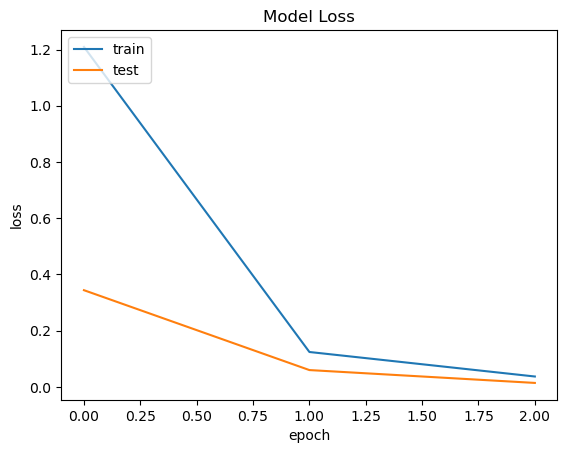

In [24]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


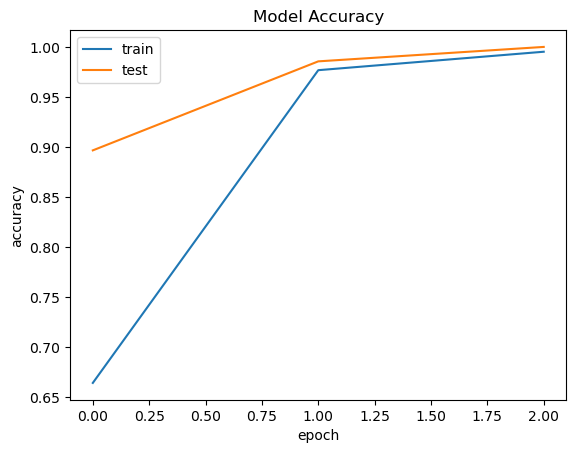

In [25]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [26]:
y_pred=model.predict(X_test)
print(y_pred[0])

33/33 [==============================] - 1s 11ms/step
[4.6835994e-04 9.9253464e-01 4.5412849e-13 8.5431640e-10 1.3526882e-08
 1.0664849e-07 2.4970035e-07 2.9679702e-14 9.2887640e-05 6.9037392e-03]


In [27]:
y_pred = [np.argmax(i) for i in y_pred]
print(y_pred[1])

4


In [28]:
comparison_df = pd.DataFrame({ 'Actual': y_test,'Predicted': y_pred})

print(comparison_df[:20])

    Actual  Predicted
0        1          1
1        4          4
2        0          0
3        6          6
4        0          0
5        9          9
6        4          4
7        4          4
8        0          0
9        5          5
10       1          1
11       6          6
12       7          7
13       0          0
14       3          3
15       6          6
16       3          3
17       5          5
18       7          7
19       7          7


In [29]:
conf_mat = confusion_matrix(y_test, y_pred)
print(conf_mat)

tf.Tensor(
[[103   0   0   0   0   0   0   0   0   0]
 [  0 102   0   0   0   0   0   0   0   0]
 [  0   0  98   0   0   0   0   0   0   0]
 [  0   0   0 105   0   0   0   0   0   0]
 [  0   0   0   0 107   0   0   0   0   0]
 [  0   0   0   0   0 100   0   0   0   0]
 [  0   0   0   0   0   0 112   0   0   0]
 [  0   0   0   0   2   0   0  98   0   0]
 [  0   0   0   0   0   0   0   0  94   0]
 [  0   0   0   0   0   0   0   0   0 119]], shape=(10, 10), dtype=int32)


Text(0.5, 47.7222222222222, 'Predicted Labels')

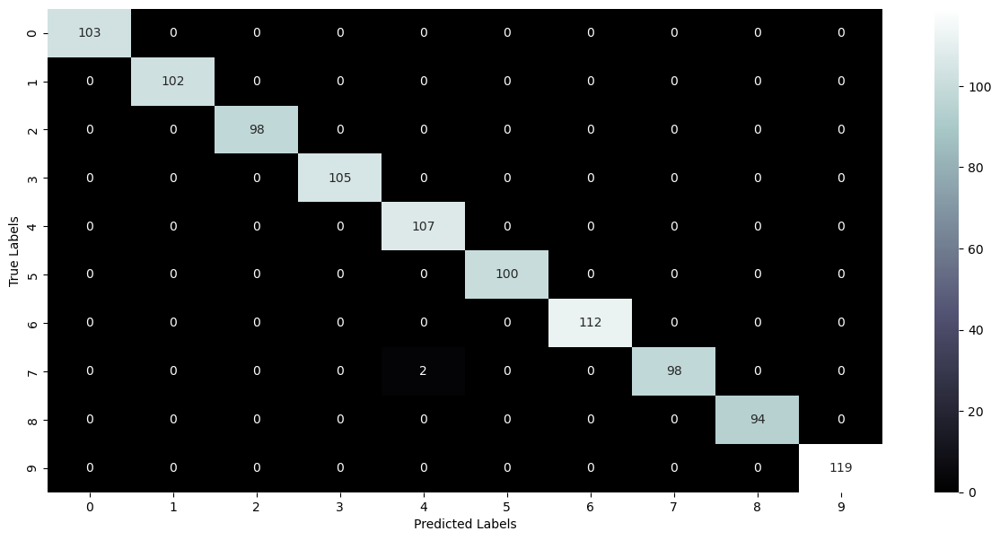

In [30]:
plt.figure(figsize=(15,7))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='bone')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')

In [31]:
from sklearn.metrics import classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       103
           1       1.00      1.00      1.00       102
           2       1.00      1.00      1.00        98
           3       1.00      1.00      1.00       105
           4       0.98      1.00      0.99       107
           5       1.00      1.00      1.00       100
           6       1.00      1.00      1.00       112
           7       1.00      0.98      0.99       100
           8       1.00      1.00      1.00        94
           9       1.00      1.00      1.00       119

    accuracy                           1.00      1040
   macro avg       1.00      1.00      1.00      1040
weighted avg       1.00      1.00      1.00      1040

